In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import datetime
from datetime import datetime as dt
import random
from sklearn.metrics import mean_squared_error

In [2]:
# Read the CSV file and filter invalid rows
df = pd.read_csv("CAvideos.csv", encoding='utf-8', on_bad_lines='skip').query('video_error_or_removed==True or video_error_or_removed==False')

In [3]:
# Define a function to convert datetime string to float time
def time_to_float(datetime_str):
    datetime_object = dt.strptime(datetime_str, '%Y-%m-%dT%H:%M:%S.%fZ')
    float_time = datetime_object.hour + datetime_object.minute / 60.0
    return float_time

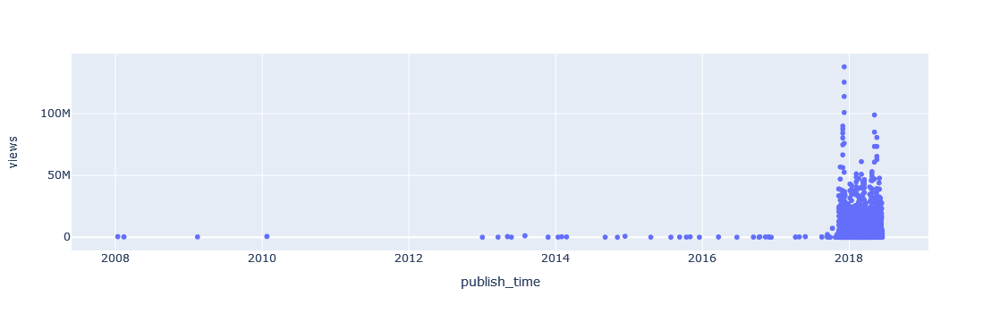

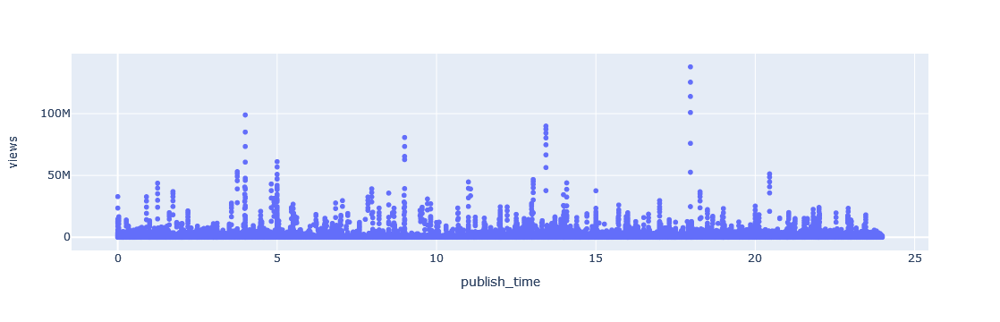

In [4]:
# Create a scatter plot of views against publish_time
fig = px.scatter(df, x='publish_time', y='views')
fig.show()

# Filter data for the year 2018 and apply the time_to_float function
df_2018 = (df[df['publish_time'].str.contains('2017|2018')]).copy()
df_2018['publish_time'] = df_2018['publish_time'].apply(time_to_float)

# Create a scatter plot for the filtered data in 2018
fig = px.scatter(df_2018, x='publish_time', y='views')
fig.show()

In [15]:
# Group by 'publish_time' and calculate the mean views for each time
df_2018_afterprocessing = df_2018.groupby('publish_time')['views'].mean().reset_index()
x = df_2018_afterprocessing['publish_time']
y = df_2018_afterprocessing['views']

Selected Model Parameters:
Degree of Polynomial (i): 0
Train Cost: 0.00016091658250229915
Test Cost: 0.00016199967463058815


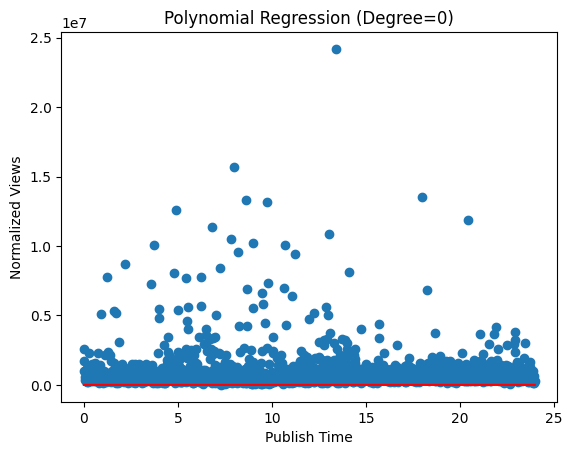

Selected Model Parameters:
Degree of Polynomial (i): 0
Train Cost: 0.00014002078596582086
Test Cost: 0.00020452072594991983


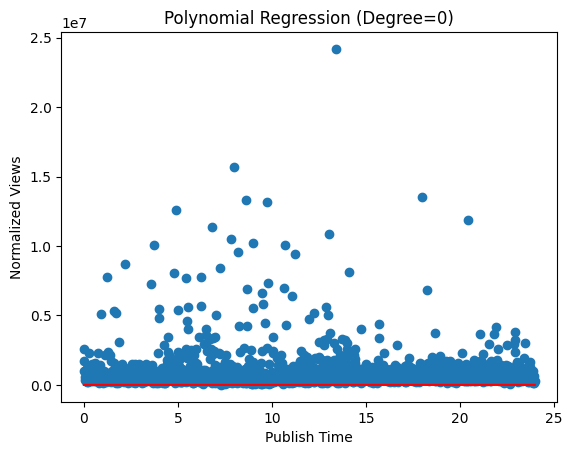

Selected Model Parameters:
Degree of Polynomial (i): 0
Train Cost: 0.0001399102263745784
Test Cost: 0.00026435960576603643


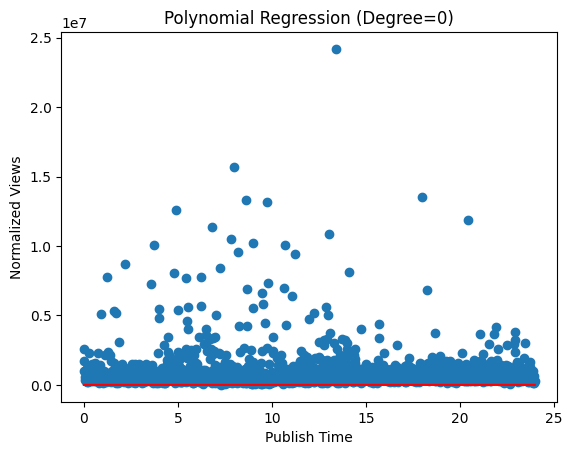

Selected Model Parameters:
Degree of Polynomial (i): 0
Train Cost: 0.00013446373304825266
Test Cost: 0.00021902301027135104


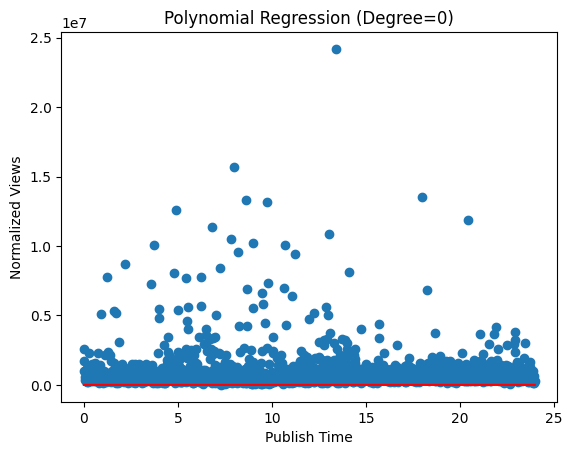

Selected Model Parameters:
Degree of Polynomial (i): 0
Train Cost: 0.00013272708067622367
Test Cost: 0.00020833143532739237


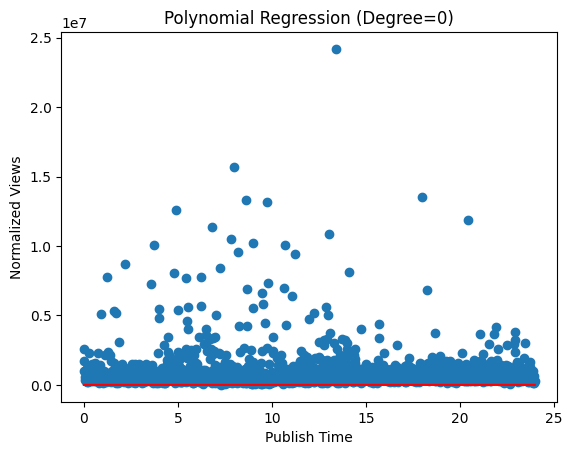

Selected Model Parameters:
Degree of Polynomial (i): 0
Train Cost: 0.0001324769983000627
Test Cost: 0.0001969591191514701


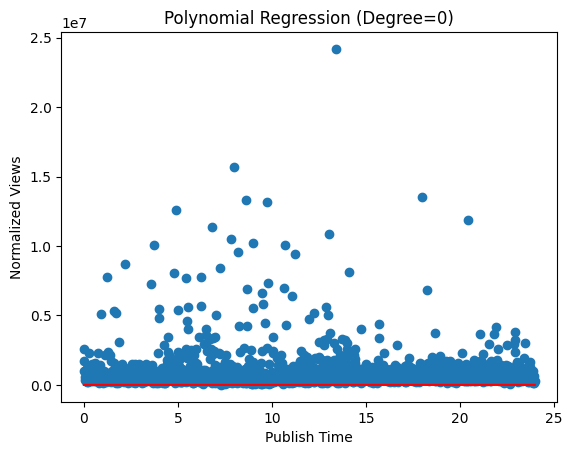

Selected Model Parameters:
Degree of Polynomial (i): 0
Train Cost: 0.00012129382662519213
Test Cost: 0.00034626228126796434


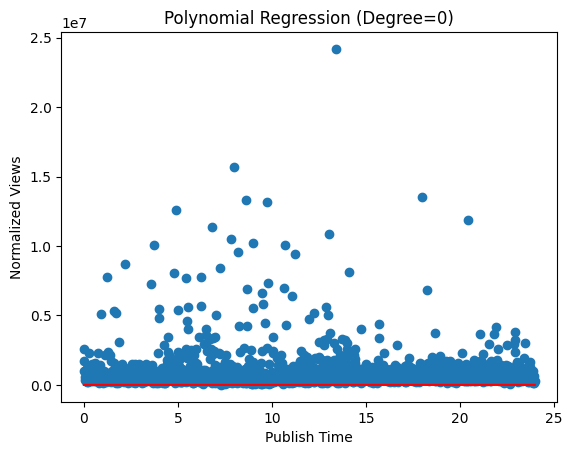

Selected Model Parameters:
Degree of Polynomial (i): 1
Train Cost: 0.00011621928005143715
Test Cost: 0.00026264809304442447


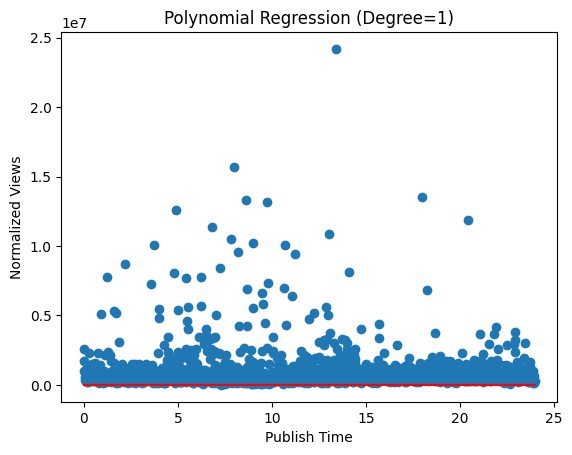

Selected Model Parameters:
Degree of Polynomial (i): 12
Train Cost: 0.00010966552905203885
Test Cost: 0.0002577843116732541


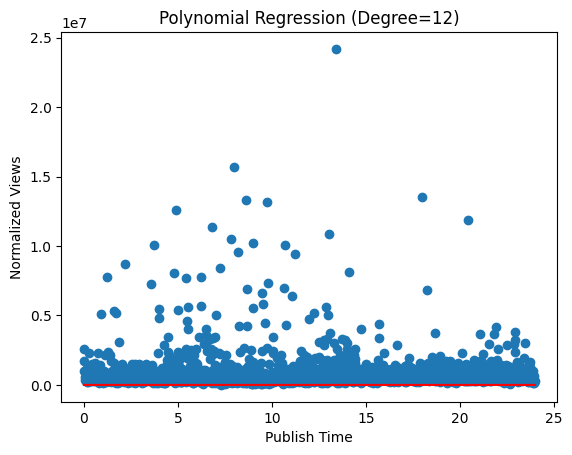

Selected Model Parameters:
Degree of Polynomial (i): 13
Train Cost: 0.00010244218478882041
Test Cost: 0.00031331633721181235


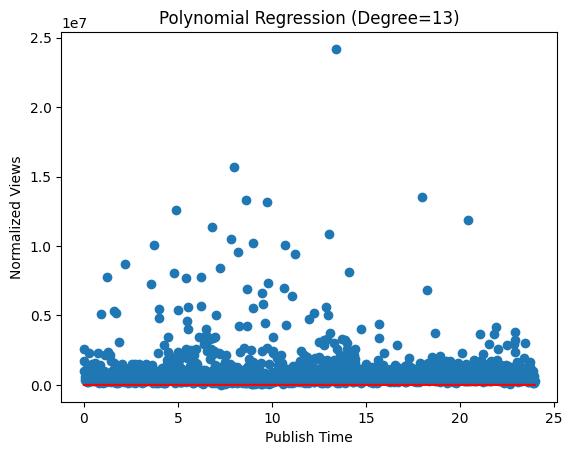

In [33]:
# Model selection using polynomial regression
train_set_percentage = 0.7
optimize_train_cost = 100
optimize_test_cost = 100
optimize_model = None
max_cost = 0.01
cost = []

# Loop through different degrees of polynomial and random samples for model selection
for i in range(18):
    for j in range(150):
        random_sample_i = np.random.choice(df_2018.index, size=int(train_set_percentage * len(df_2018)), replace=False)
        df_2018_train = df_2018.loc[random_sample_i].copy()
        df_2018_test = pd.concat([df_2018, df_2018_train]).drop_duplicates(keep=False).copy()

        # Normalize train set and test set
        normalize_max = max(df_2018_train['views'])
        normalize_min = min(df_2018_train['views'])
        df_2018_train['views'] = (df_2018_train['views'] - normalize_min) / (normalize_max - normalize_min)
        df_2018_test['views'] = (df_2018_test['views'] - normalize_min) / (normalize_max - normalize_min)

        # Group by 'publish_time' and calculate mean for train and test sets
        df_2018_train_afterprocessing = df_2018_train.groupby('publish_time')['views'].mean().reset_index()
        x_train = df_2018_train_afterprocessing['publish_time']
        y_train = df_2018_train_afterprocessing['views']

        df_2018_test_afterprocessing = df_2018_test.groupby('publish_time')['views'].mean().reset_index()
        x_test = df_2018_test_afterprocessing['publish_time']
        y_test = df_2018_test_afterprocessing['views']

        # Fit a polynomial model
        mymodel = np.poly1d(np.polyfit(x_train, y_train, i))
        y_train_pred = mymodel(x_train)
        y_test_pred = mymodel(x_test)

        # Calculate mean squared error for train and test sets
        train_cost = mean_squared_error(y_train_pred, y_train)
        test_cost = mean_squared_error(y_test_pred, y_test)

        # Check conditions for model selection
        if (train_cost < max_cost and test_cost < max_cost and abs(train_cost - test_cost) < 0.0005):
            if (train_cost < optimize_train_cost):
                optimize_train_cost = train_cost
                cost.append((i, train_cost, test_cost))
                optimize_model = mymodel
                
                # Print information about the selected model and plot it
                print("Selected Model Parameters:")
                print("Degree of Polynomial (i):", i)
                print("Train Cost:", train_cost)
                print("Test Cost:", test_cost)
                plt.scatter(x, y)
                plt.plot(x, mymodel(x), color='red')
                plt.title(f"Polynomial Regression (Degree={i})")
                plt.xlabel('Publish Time')
                plt.ylabel('Normalized Views')
                plt.show()

since the split of train set and test set are random, each time the training result will be slightly different
so train multiple time to found the common part of the model

[(0, 0.00016091658250229915, 0.00016199967463058815), (0, 0.00014002078596582086, 0.00020452072594991983), (0, 0.0001399102263745784, 0.00026435960576603643), (0, 0.00013446373304825266, 0.00021902301027135104), (0, 0.00013272708067622367, 0.00020833143532739237), (0, 0.0001324769983000627, 0.0001969591191514701), (0, 0.00012129382662519213, 0.00034626228126796434), (1, 0.00011621928005143715, 0.00026264809304442447), (12, 0.00010966552905203885, 0.0002577843116732541), (13, 0.00010244218478882041, 0.00031331633721181235)]
           9             8             7             6             5
2.789e-11 x - 2.992e-09 x + 1.333e-07 x - 3.192e-06 x + 4.427e-05 x
              4            3            2
 - 0.0003571 x + 0.001586 x - 0.003424 x + 0.003336 x + 0.0054


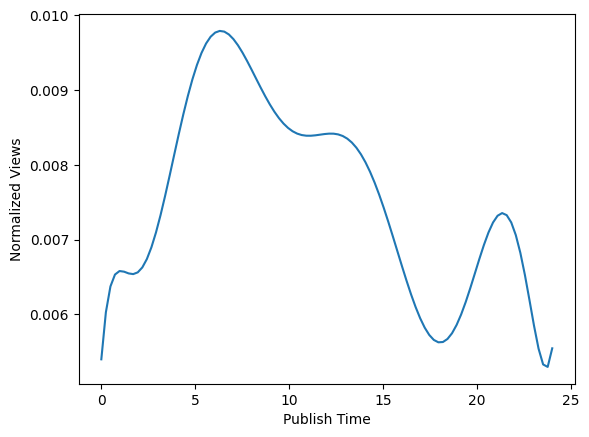

In [46]:
# Plot the optimized model
myline = np.linspace(0, 24, 100)
print(cost)
optimize_model1=optimize_model
print(optimize_model1)
plt.plot(myline, optimize_model1(myline))
plt.xlabel('Publish Time')
plt.ylabel('Normalized Views')
plt.show()

[(0, 0.00016091658250229915, 0.00016199967463058815), (0, 0.00014002078596582086, 0.00020452072594991983), (0, 0.0001399102263745784, 0.00026435960576603643), (0, 0.00013446373304825266, 0.00021902301027135104), (0, 0.00013272708067622367, 0.00020833143532739237), (0, 0.0001324769983000627, 0.0001969591191514701), (0, 0.00012129382662519213, 0.00034626228126796434), (1, 0.00011621928005143715, 0.00026264809304442447), (12, 0.00010966552905203885, 0.0002577843116732541), (13, 0.00010244218478882041, 0.00031331633721181235)]
           16            15            14            13             12
-6.63e-17 x  + 1.18e-14 x  - 9.37e-13 x  + 4.37e-11 x  - 1.321e-09 x 
              11             10             9             8
 + 2.688e-08 x  - 3.653e-07 x  + 3.064e-06 x - 1.015e-05 x
              7            6            5           4           3
 - 9.057e-05 x + 0.001446 x - 0.009367 x + 0.03445 x - 0.07276 x
            2
 + 0.08081 x - 0.03802 x + 0.01074


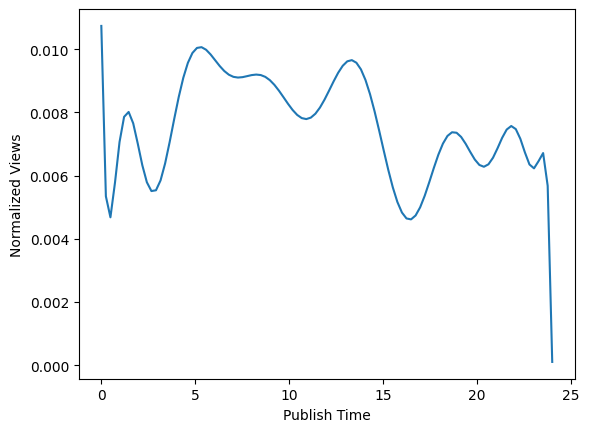

In [47]:
# Plot the optimized model
myline = np.linspace(0, 24, 100)
print(cost)
optimize_model2=optimize_model
print(optimize_model2)
plt.plot(myline, optimize_model2(myline))
plt.xlabel('Publish Time')
plt.ylabel('Normalized Views')
plt.show()

[(0, 0.00016091658250229915, 0.00016199967463058815), (0, 0.00014002078596582086, 0.00020452072594991983), (0, 0.0001399102263745784, 0.00026435960576603643), (0, 0.00013446373304825266, 0.00021902301027135104), (0, 0.00013272708067622367, 0.00020833143532739237), (0, 0.0001324769983000627, 0.0001969591191514701), (0, 0.00012129382662519213, 0.00034626228126796434), (1, 0.00011621928005143715, 0.00026264809304442447), (12, 0.00010966552905203885, 0.0002577843116732541), (13, 0.00010244218478882041, 0.00031331633721181235)]
           13             12             11             10            9
3.642e-16 x  + 3.008e-14 x  - 9.428e-12 x  + 7.359e-10 x  - 3.01e-08 x
             8             7            6             5            4
 + 7.53e-07 x - 1.218e-05 x + 0.000129 x - 0.0008835 x + 0.003759 x
             3           2
 - 0.009265 x + 0.01185 x - 0.006136 x + 0.006894


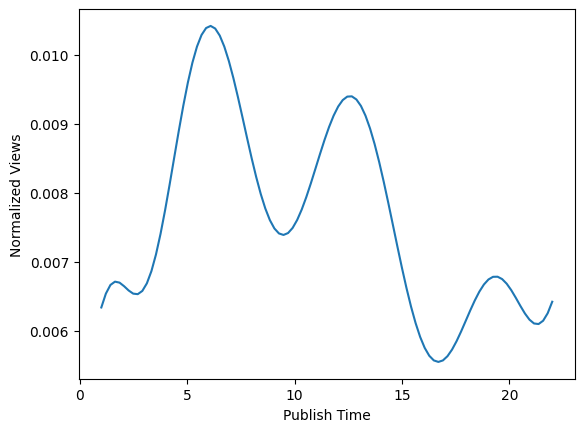

In [34]:
# Plot the optimized model
myline = np.linspace(0, 24, 100)
print(cost)
optimize_model3=optimize_model
print(optimize_model3)
plt.plot(myline, optimize_model3(myline))
plt.xlabel('Publish Time')
plt.ylabel('Normalized Views')
plt.show()

In [40]:
##found the local minimum and maximum of opoptimize_model1
# Find the roots (critical points) of the optimize_model1
optimize_model1_d=optimize_model1.deriv()
print(optimize_model1_d)

# Find the roots (critical points) of the derivative polynomial
critical_points1 = np.roots(optimize_model1_d)

# Display the critical points
print("Critical Points:", critical_points1)

          8             7             6             5             4
2.51e-10 x - 2.394e-08 x + 9.333e-07 x - 1.915e-05 x + 0.0002214 x
             3            2
 - 0.001428 x + 0.004757 x - 0.006849 x + 0.003336
Critical Points: [23.67533354 21.35338849 18.03412701 12.22845916 11.039547    6.34830138
  1.66094389  1.0242426 ]


by the graph above, mannually match the local maximum and minimum:
left boundary:1.0242426 #ignore
local min1(0-5)：1.66094389
local max1 also the max(5-7): 6.34830138
local min2(7-10) : 11.039547
local max2(10-15): 12.22845916
local min3 also the min(15-20): 18.03412701
local max3(20-22): 21.35338849
right boundary:23.67533354 #ignore

In [41]:
##found the local minimum and maximum of opoptimize_model2
# Find the roots (critical points) of the optimize_model2
optimize_model2_d=optimize_model2.deriv()
print(optimize_model2_d)

# Find the roots (critical points) of the derivative polynomial
critical_points2 = np.roots(optimize_model2_d)

# Display the critical points
print("Critical Points:", critical_points2)

            15             14             13             12
-1.061e-15 x  + 1.769e-13 x  - 1.312e-11 x  + 5.681e-10 x 
              11             10             9             8
 - 1.586e-08 x  + 2.957e-07 x  - 3.653e-06 x + 2.757e-05 x
              7            6            5           4          3
 - 8.116e-05 x - 0.000634 x + 0.008676 x - 0.04684 x + 0.1378 x
           2
 - 0.2183 x + 0.1616 x - 0.03802
Critical Points: [-6.6131067  23.50411134 22.99355508 21.83301864 20.34894478 18.75742716
 16.40928989 13.29304666 10.88834482  8.26445797  7.29207691  5.25859608
  2.76742571  1.39401849  0.41438577]


by the graph above, mannually match the local maximum and minimum:

local min1:0.41438577
local max1:1.39401849
local min2:2.76742571
local max2 also the max:5.25859608
local min3:7.29207691
local max3:8.26445797
local min4:10.88834482
local max4:13.29304666
local min5 also the min:16.40928989
local max5:18.75742716
local min6:20.34894478
local max6:21.83301864
local min7:22.99355508
local max7:23.50411134

In [43]:
##found the local minimum and maximum of opoptimize_model3
# Find the roots (critical points) of the optimize_model3
optimize_model3_d=optimize_model3.deriv()
print(optimize_model3_d)

# Find the roots (critical points) of the derivative polynomial
critical_points3 = np.roots(optimize_model3_d)

# Display the critical points
print("Critical Points:", critical_points3)

           12            11             10             9             8
4.735e-15 x  + 3.61e-13 x  - 1.037e-10 x  + 7.359e-09 x - 2.709e-07 x
              7             6            5            4           3
 + 6.024e-06 x - 8.523e-05 x + 0.000774 x - 0.004418 x + 0.01504 x
           2
 - 0.0278 x + 0.0237 x - 0.006136
Critical Points: [-216.68378199   27.25210875   22.9677445    21.2927385    19.35775282
   16.69471238   12.57702655    9.47092134    6.07858823    2.62687734
    1.68252376    0.43389154]


by the graph above, mannually match the local maximum and minimum:
left boundary:0.43389154 #ignore
local max1:1.68252376
local min1:2.62687734
local max2 also the max:6.07858823 
local min2:9.47092134 
local max3:12.57702655
local min3 also the min:16.69471238
local max4:19.35775282
local min4:21.2927385
right boundary:22.9677445  #ignore

so in summary 
we found that the maximum views is all appear between 05:00 and 07:00
and the minimum views is always appears ataround 16:30 and 18:30